In [41]:
import numpy as np
import tensorflow
from sklearn import datasets
from tensorflow.keras.utils import to_categorical

all_categories = ['alt.atheism','comp.graphics','comp.os.ms-windows.misc','comp.sys.ibm.pc.hardware',
                  'comp.sys.mac.hardware','comp.windows.x', 'misc.forsale','rec.autos','rec.motorcycles',
                  'rec.sport.baseball','rec.sport.hockey','sci.crypt','sci.electronics','sci.med',
                  'sci.space','soc.religion.christian','talk.politics.guns','talk.politics.mideast',
                  'talk.politics.misc','talk.religion.misc']

selected_categories = ['alt.atheism','comp.graphics','rec.sport.hockey','sci.space','talk.politics.misc']

X_train, Y_train = datasets.fetch_20newsgroups(subset="train", categories=selected_categories, return_X_y=True)
X_test , Y_test  = datasets.fetch_20newsgroups(subset="test", categories=selected_categories, return_X_y=True)

X_train = np.array(X_train)
X_test = np.array(X_test)
y_train = to_categorical(Y_train)
y_test = to_categorical(Y_test)

classes = np.unique(Y_train)
mapping = dict(zip(classes, selected_categories))
print(X_train[0])
print(X_train.shape)
print(y_train[0])
print(len(X_train), len(X_test))
print(classes)
print(mapping)

From: markus@octavia.anu.edu.au (Markus Buchhorn)
Subject: HDF readers/viewers
Organization: Australian National University, Canberra
Lines: 33
Distribution: world
NNTP-Posting-Host: 150.203.5.35
Originator: markus@octavia



G'day all,

Can anybody point me at a utility which will read/convert/crop/whatnot/
display HDF image files ? I've had a look at the HDF stuff under NCSA 
and it must take an award for odd directory structure, strange storage
approaches and minimalist documentation :-)

Part of the problem is that I want to look at large (5MB+) HDF files and
crop out a section. Ideally I would like a hdftoppm type of utility, from
which I can then use the PBMplus stuff quite merrily. I can convert the cropped
part into another format for viewing/animation.

Otherwise, can someone please explain how to set up the NCSA Visualisation S/W
for HDF (3.2.r5 or 3.3beta) and do the above cropping/etc. This is for
Suns with SunOS 4.1.2.

Any help GREATLY appreciated. Ta muchly !

Cheers,
	M

In [42]:
text_vectorizer = tensorflow.keras.layers.TextVectorization(max_tokens=10000, 
                                    standardize="lower_and_strip_punctuation",
                                    split="whitespace", output_mode="int",output_sequence_length=300)

text_vectorizer.adapt(np.concatenate((X_train, X_test)))

vocab = text_vectorizer.get_vocabulary()
print("Vocab : {}".format(vocab[:10]))
out = text_vectorizer(X_train[:5])
print("Output Shape : {}".format(out.shape))

Vocab : ['', '[UNK]', 'the', 'to', 'of', 'a', 'and', 'in', 'is', 'that']
Output Shape : (5, 300)


In [47]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers
from tensorflow.keras.regularizers import l1

model=Sequential()
model.add(layers.Input(shape=(1,), dtype="string"))
model.add(text_vectorizer)
model.add(layers.Embedding(10000,100))
model.add(layers.Dropout(0.4))
model.add(layers.Dense(64, activation="relu"))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(32, activation="relu"))
model.add(layers.Dense(8, activation="relu"))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(len(classes), activation="softmax"))
    
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 text_vectorization_1 (TextV  (None, 300)              0         
 ectorization)                                                   
                                                                 
 embedding_2 (Embedding)     (None, 300, 100)          1000000   
                                                                 
 dropout_6 (Dropout)         (None, 300, 100)          0         
                                                                 
 dense_8 (Dense)             (None, 300, 64)           6464      
                                                                 
 dropout_7 (Dropout)         (None, 300, 64)           0         
                                                                 
 dense_9 (Dense)             (None, 300, 32)           2080      
                                                      

In [48]:
model.compile(loss="categorical_crossentropy",optimizer="adam", metrics=["accuracy"])
history = model.fit(X_train, y_train, batch_size=256, epochs=40, validation_data=(X_test, y_test))

Epoch 1/40
11/11 [==============================] - 4s 266ms/step - loss: 1.6025 - accuracy: 0.2248 - val_loss: 1.5912 - val_accuracy: 0.2424
Epoch 2/40
11/11 [==============================] - 3s 243ms/step - loss: 1.5783 - accuracy: 0.2597 - val_loss: 1.5708 - val_accuracy: 0.2717
Epoch 3/40
11/11 [==============================] - 2s 230ms/step - loss: 1.5505 - accuracy: 0.3053 - val_loss: 1.5700 - val_accuracy: 0.2711
Epoch 4/40
11/11 [==============================] - 3s 270ms/step - loss: 1.5315 - accuracy: 0.3163 - val_loss: 1.5515 - val_accuracy: 0.3087
Epoch 5/40
11/11 [==============================] - 3s 235ms/step - loss: 1.5001 - accuracy: 0.3688 - val_loss: 1.5331 - val_accuracy: 0.3219
Epoch 6/40
11/11 [==============================] - 2s 219ms/step - loss: 1.4682 - accuracy: 0.3880 - val_loss: 1.4969 - val_accuracy: 0.3865
Epoch 7/40
11/11 [==============================] - 2s 215ms/step - loss: 1.3741 - accuracy: 0.4831 - val_loss: 1.4175 - val_accuracy: 0.4390
Epoch 

In [45]:
from sklearn.metrics import accuracy_score, classification_report

train_preds = model.predict(X_train)
test_preds = model.predict(X_test)

print("Train Accuracy : {:.3f}".format(accuracy_score(Y_train, np.argmax(train_preds, axis=1))))
print("Test  Accuracy : {:.3f}".format(accuracy_score(Y_test, np.argmax(test_preds, axis=1))))
print("\nClassification Report : ")
print(classification_report(Y_test, np.argmax(test_preds, axis=1), target_names=selected_categories))

57/57 [==============================] - 0s 8ms/step
Train Accuracy : 0.999
Test  Accuracy : 0.850

Classification Report : 
                    precision    recall  f1-score   support

       alt.atheism       0.85      0.76      0.80       319
     comp.graphics       0.88      0.94      0.91       389
  rec.sport.hockey       0.93      0.92      0.92       399
         sci.space       0.85      0.81      0.83       394
talk.politics.misc       0.72      0.79      0.76       310

          accuracy                           0.85      1811
         macro avg       0.85      0.84      0.84      1811
      weighted avg       0.85      0.85      0.85      1811



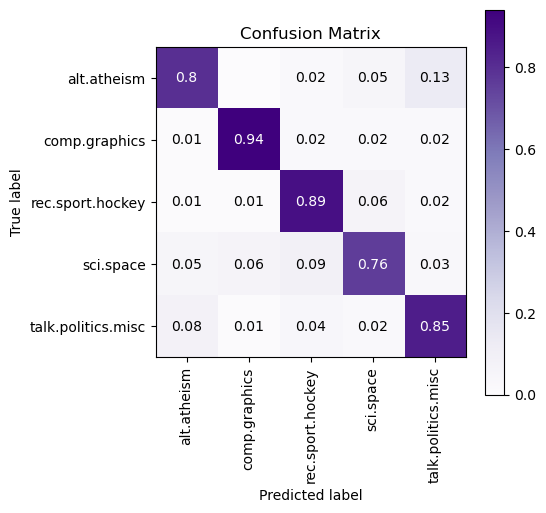

In [8]:
#!pip install scikit-plot
from sklearn.metrics import confusion_matrix
import scikitplot as skplt
import matplotlib.pyplot as plt

skplt.metrics.plot_confusion_matrix([selected_categories[i] for i in Y_test], [selected_categories[i] for i in np.argmax(test_preds, axis=1)],
                                    normalize=True,
                                    title="Confusion Matrix",
                                    cmap="Purples",
                                    hide_zeros=True,
                                    figsize=(5,5)
                                    );
plt.xticks(rotation=90);

In [50]:
import shap
masker = shap.maskers.Text(tokenizer=r"\W+")#단어별로분리(특수문자제외)
explainer = shap.Explainer(model, masker=masker, output_names=selected_categories)

explainer

In [56]:
X_batch = X_test[3:5]

#print("Samples : ")
for text in X_batch:
    #print(re.split(r"\W+", text))
    print()

preds_proba = model.predict(X_batch)
preds = preds_proba.argmax(axis=1)

print("Actual    Target Values : {}".format([selected_categories[target] for target in Y_test[3:5]]))
print("Predicted Target Values : {}".format([selected_categories[target] for target in preds]))
print("Predicted Probabilities : {}".format(preds_proba.max(axis=1)))

shap_values = explainer([text.lower() for text in X_batch]) ## Generate SHAP VAlues

Samples : 


1/1 [==============================] - 0s 18ms/step
Actual    Target Values : ['sci.space', 'talk.politics.misc']
Predicted Target Values : ['sci.space', 'talk.politics.misc']
Predicted Probabilities : [0.88973486 0.9988432 ]


In [61]:
#print(shap_values[0])
print("SHAP Values Shape : {}".format(shap_values.shape))
print("SHAP Base Values  : {}".format(shap_values.base_values))
print("SHAP Data : ")
print(shap_values.data[0])
#print(shap_values.data[1])

SHAP Values Shape : (2, None, 5)
SHAP Base Values  : [[0.012777   0.95019722 0.03116345 0.00124084 0.0046215 ]
 [0.012777   0.95019722 0.03116345 0.00124084 0.0046215 ]]
SHAP Data : 
['from: ' 'stk1203@' 'vax003.' 'stockton.' 'edu\n' 'subject: ' 'internet '
 'resources\n' 'x-' 'added: ' 'forwarded ' 'by ' 'space ' 'digest\n'
 'organization: [' 'via ' 'international ' 'space ' 'university]\n'
 'original-' 'sender: ' 'isu@' 'vacation.' 'venari.' 'cs.' 'cmu.' 'edu\n'
 'distribution: ' 'sci\n' 'lines: ' '4\n\n' 'exit']


In [62]:
shap.text_plot(shap_values)

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


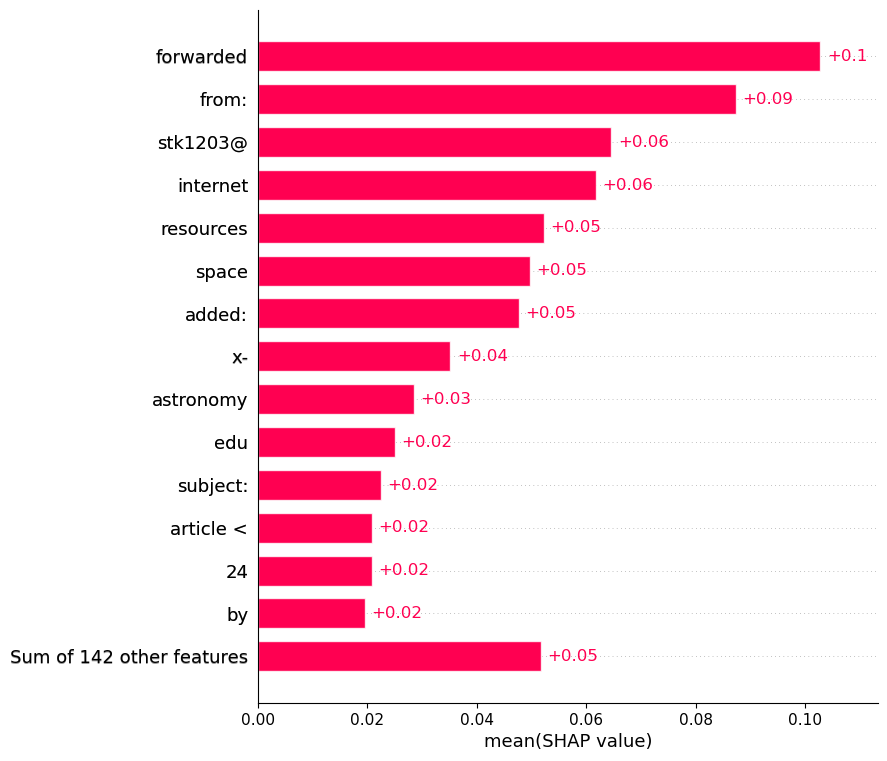

In [63]:
shap.plots.bar(shap_values[:,:, selected_categories[preds[0]]].mean(axis=0), max_display=15,
               order=shap.Explanation.argsort.flip)

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


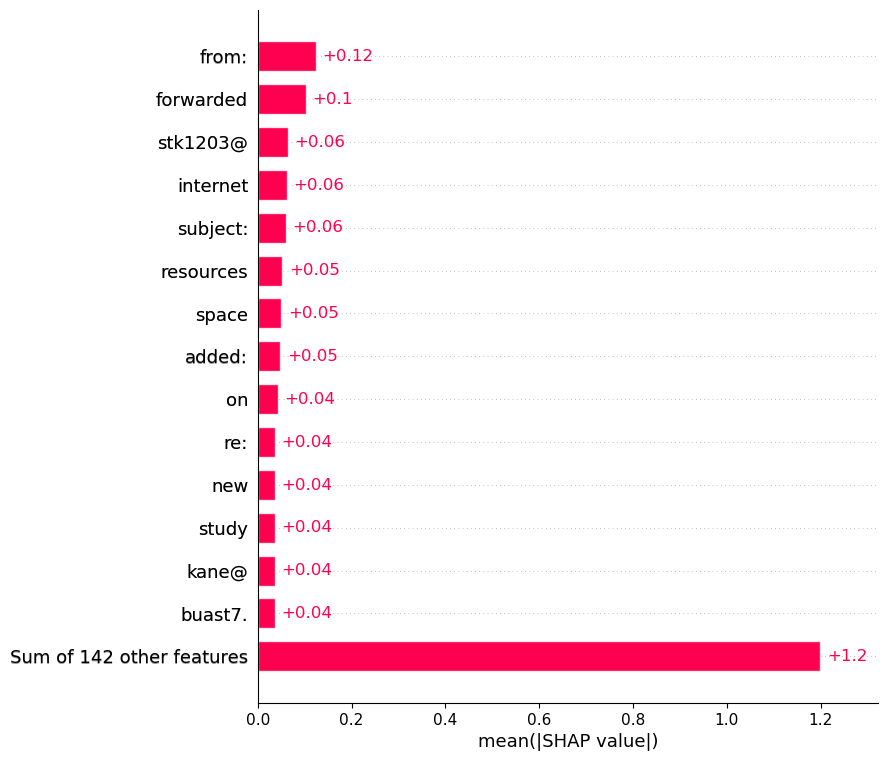

In [64]:
shap.plots.bar(shap_values[:,:, selected_categories[preds[0]]], max_display=15)

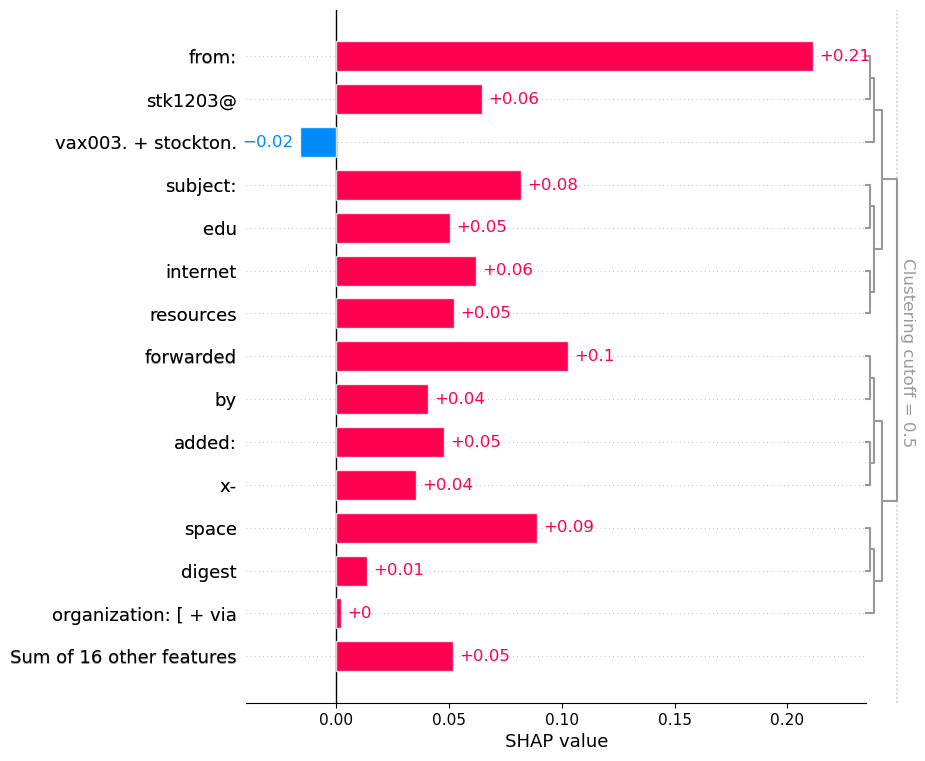

In [65]:
shap.plots.bar(shap_values[0,:, selected_categories[preds[0]]], max_display=15,
               order=shap.Explanation.argsort.flip)

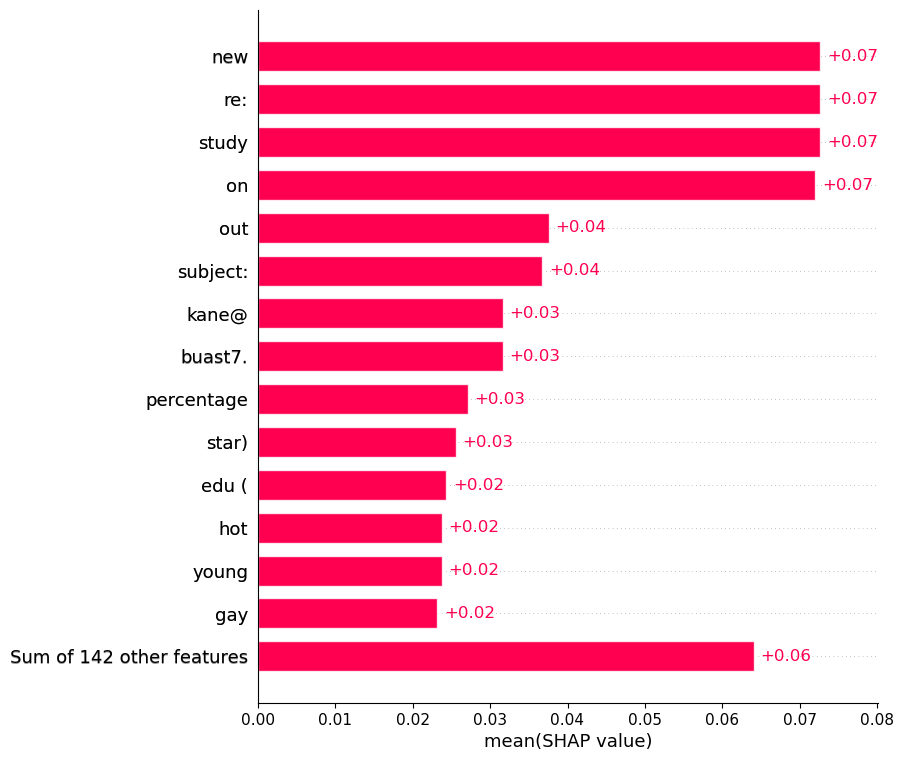

In [66]:
shap.plots.bar(shap_values[:,:, selected_categories[preds[1]]].mean(axis=0), max_display=15,
               order=shap.Explanation.argsort.flip)

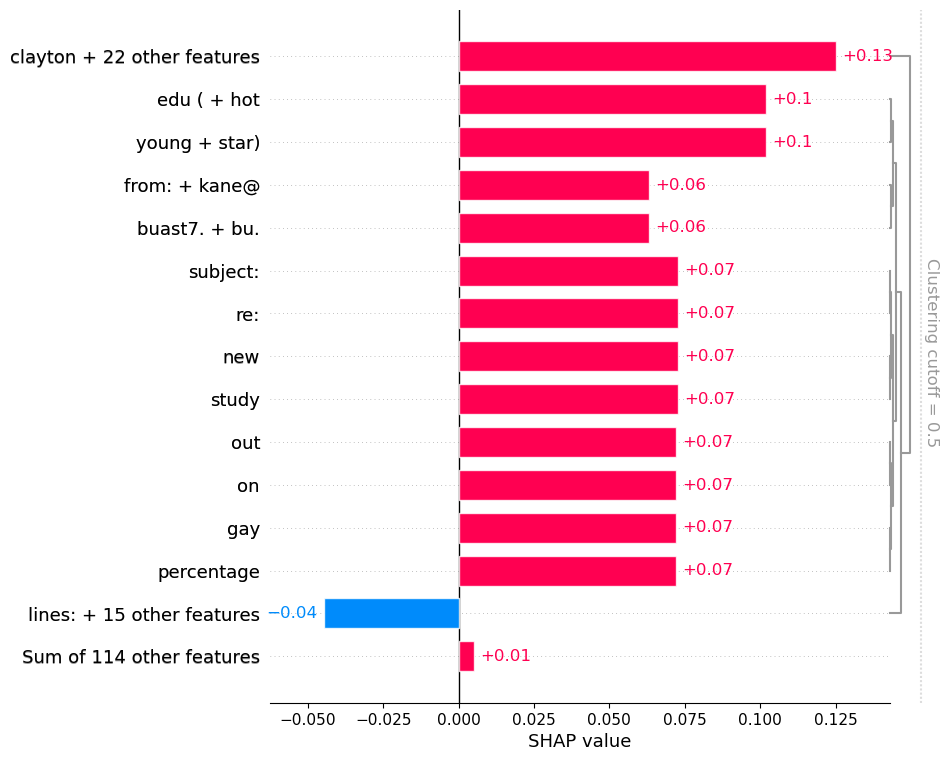

In [67]:
shap.plots.bar(shap_values[1,:, selected_categories[preds[1]]], max_display=15,
               order=shap.Explanation.argsort.flip)

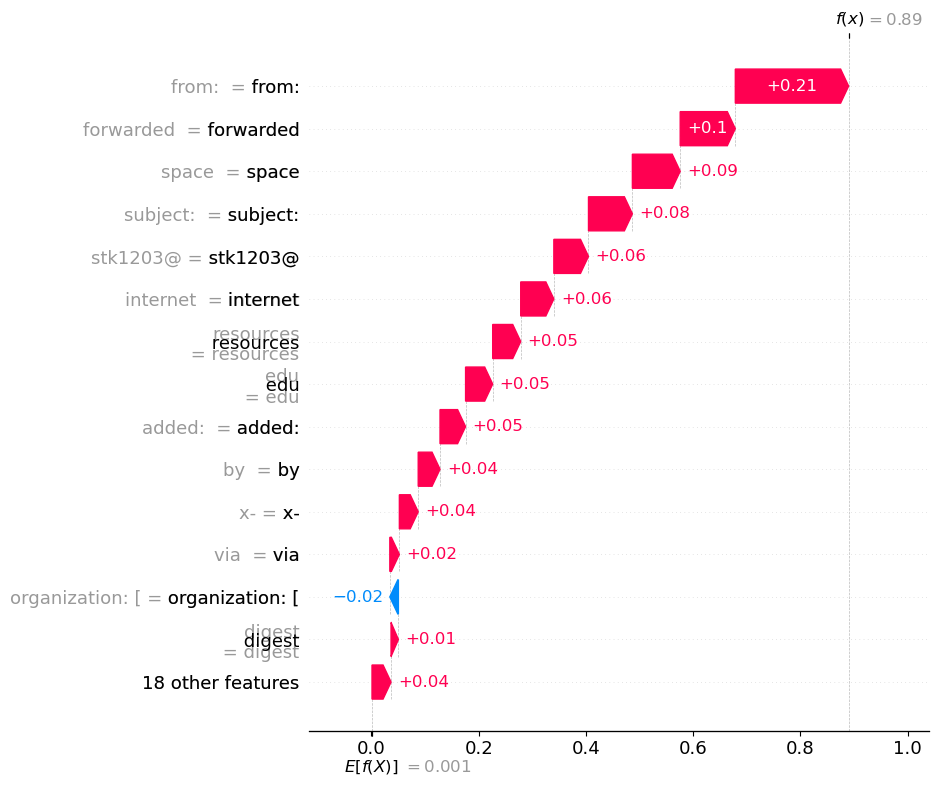

In [68]:
shap.waterfall_plot(shap_values[0,:, selected_categories[preds[0]]], max_display=15)

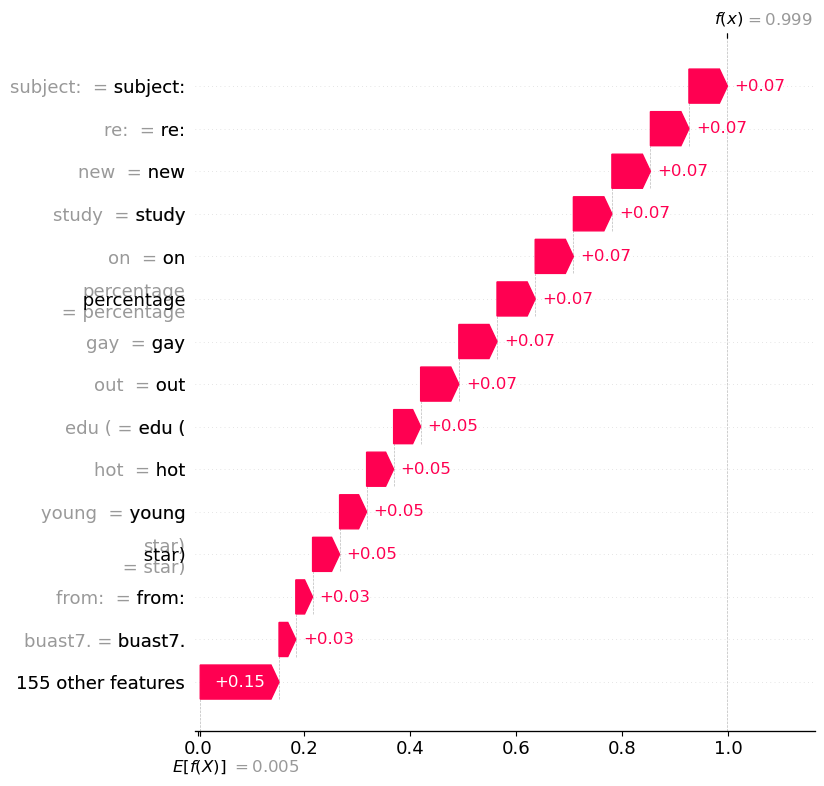

In [69]:
shap.waterfall_plot(shap_values[1,:, selected_categories[preds[1]]], max_display=15)

In [70]:
print(selected_categories)

['alt.atheism', 'comp.graphics', 'rec.sport.hockey', 'sci.space', 'talk.politics.misc']


In [71]:
import re

tokens = re.split("\W+", X_batch[0].lower())

shap.force_plot(shap_values.base_values[0][preds[0]], shap_values[0][:, preds[0]].values,
                feature_names = tokens[:-1], out_names=selected_categories[preds[0]])

In [72]:
import re
shap.initjs()
tokens = re.split("\W+", X_batch[1].lower())

shap.force_plot(shap_values.base_values[1][preds[1]], shap_values[1][:, preds[1]].values,
                feature_names = tokens[:-1], out_names=selected_categories[preds[1]])

# 틀린 경우

In [27]:
import re

Y_test_preds = model.predict(X_test)
Y_test_preds = Y_test_preds.argmax(axis=1)

wrong_preds = np.argwhere(Y_test!=Y_test_preds)
X_batch = X_test[wrong_preds.flatten()[:2]]

print("Samples : ")
for text in X_batch:
    print(re.split(r"\W+", text))
    print()

preds_proba = model.predict(X_batch)
preds = preds_proba.argmax(axis=1)

print("Actual    Target Values : {}".format([selected_categories[target] for target in Y_test[wrong_preds.flatten()[:2]]]))
print("Predicted Target Values : {}".format([selected_categories[target] for target in preds]))
print("Predicted Probabilities : {}".format(preds_proba.max(axis=1)))

shap_values = explainer([text.lower() for text in X_batch])

shap_values.shape

57/57 [==============================] - 1s 10ms/step
Samples : 
['From', 'shafer', 'rigel', 'dfrf', 'nasa', 'gov', 'Mary', 'Shafer', 'Subject', 'Re', 'Who', 'is', 'Henry', 'Spencer', 'anyway', 'In', 'Reply', 'To', 'hansk', 'aie', 'nl', 's', 'message', 'of', 'Sat', '15', 'May', '1993', '01', '45', '54', 'GMT', 'Organization', 'NASA', 'Dryden', 'Edwards', 'Cal', 'Lines', '17', 'On', 'Sat', '15', 'May', '1993', '01', '45', '54', 'GMT', 'hansk', 'aie', 'nl', 'Hans', 'Kinwel', 'said', 'Hans', 'As', 'somebody', 'replied', 'on', 'whether', 'the', 'space', 'shuttle', 'is', 'connected', 'to', 'Hans', 'Usenet', 'No', 'Of', 'course', 'the', 'main', 'flow', 'of', 'information', 'would', 'be', 'up', 'Hans', 'unless', 'Henry', 'Spencer', 'would', 'be', 'aboard', 'in', 'which', 'case', 'the', 'main', 'Hans', 'flow', 'of', 'information', 'would', 'be', 'down', 'Gene', 'Miya', 'says', 'that', 'Henry', 'will', 'never', 'go', 'aloft', 'in', 'the', 'Shuttle', 'the', 'payload', 'bay', 'isn', 't', 'big', '

(2, None, 5)

In [28]:
print("SHAP Values Shape : {}".format(shap_values.shape))
print("SHAP Base Values  : {}".format(shap_values.base_values))

SHAP Values Shape : (2, None, 5)
SHAP Base Values  : [[0.06730205 0.23268729 0.2716924  0.29916    0.12915832]
 [0.06730205 0.23268729 0.2716924  0.29916    0.12915832]]


In [29]:
shap.text_plot(shap_values)

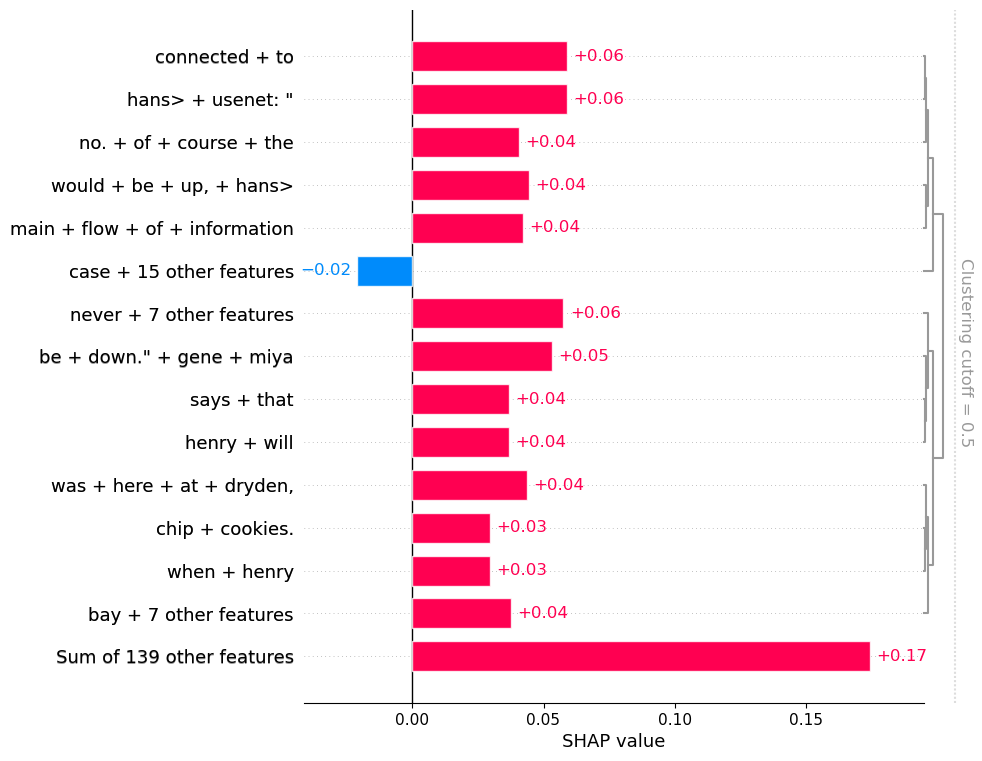

In [30]:
shap.plots.bar(shap_values[0,:, selected_categories[preds[0]]], max_display=15,
               order=shap.Explanation.argsort.flip)

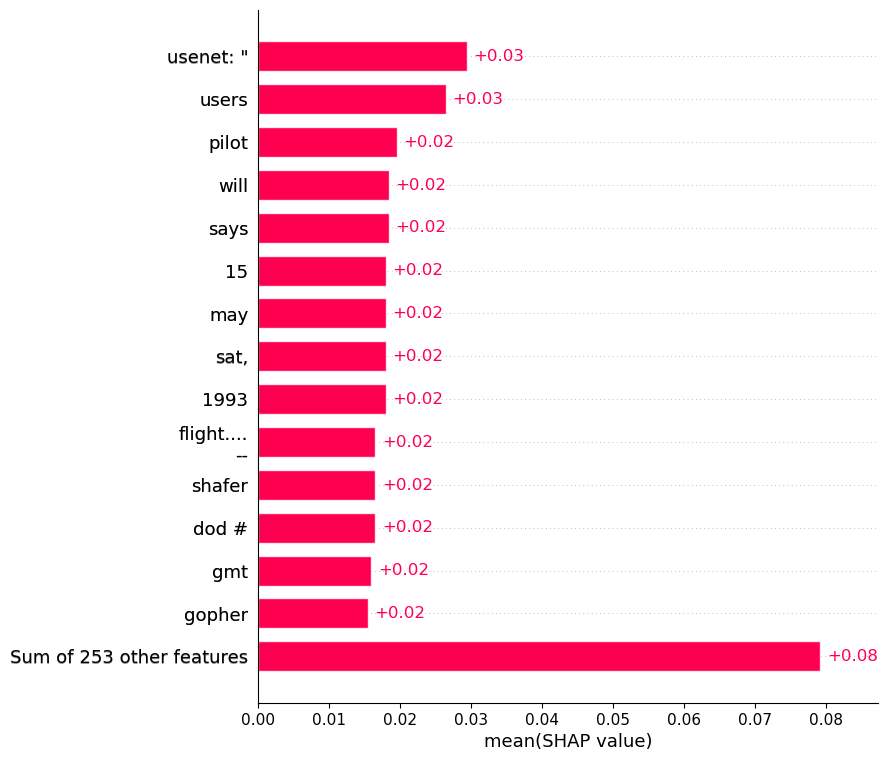

In [31]:
shap.plots.bar(shap_values[:,:, selected_categories[preds[0]]].mean(axis=0), max_display=15,
               order=shap.Explanation.argsort.flip)

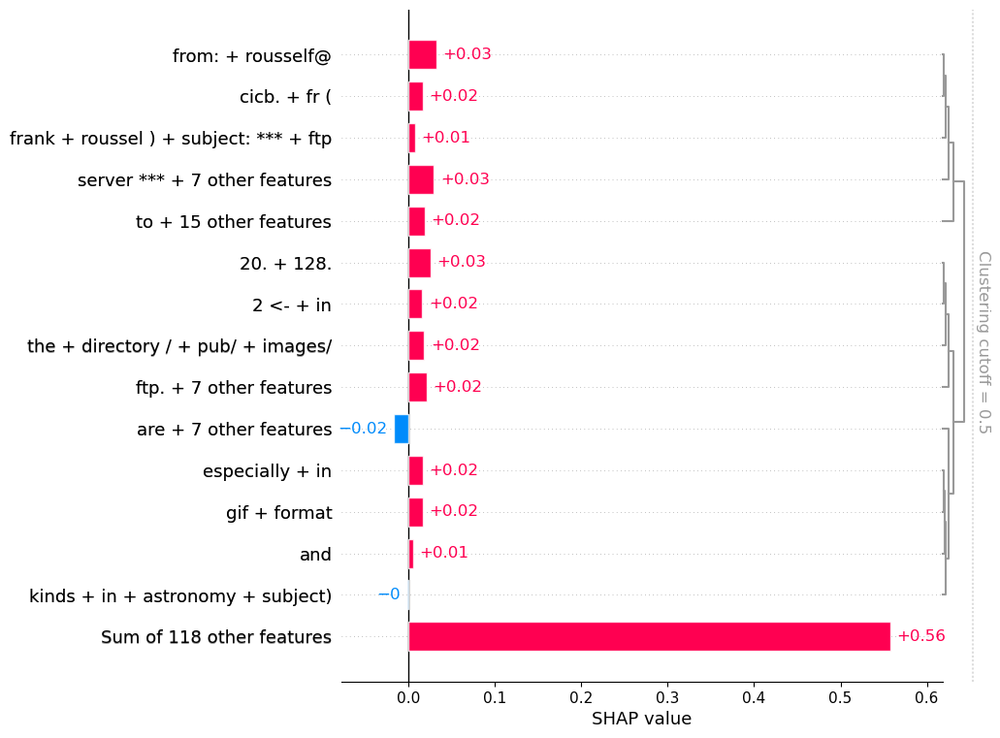

In [32]:
shap.plots.bar(shap_values[1,:, selected_categories[preds[1]]], max_display=15,
               order=shap.Explanation.argsort.flip)

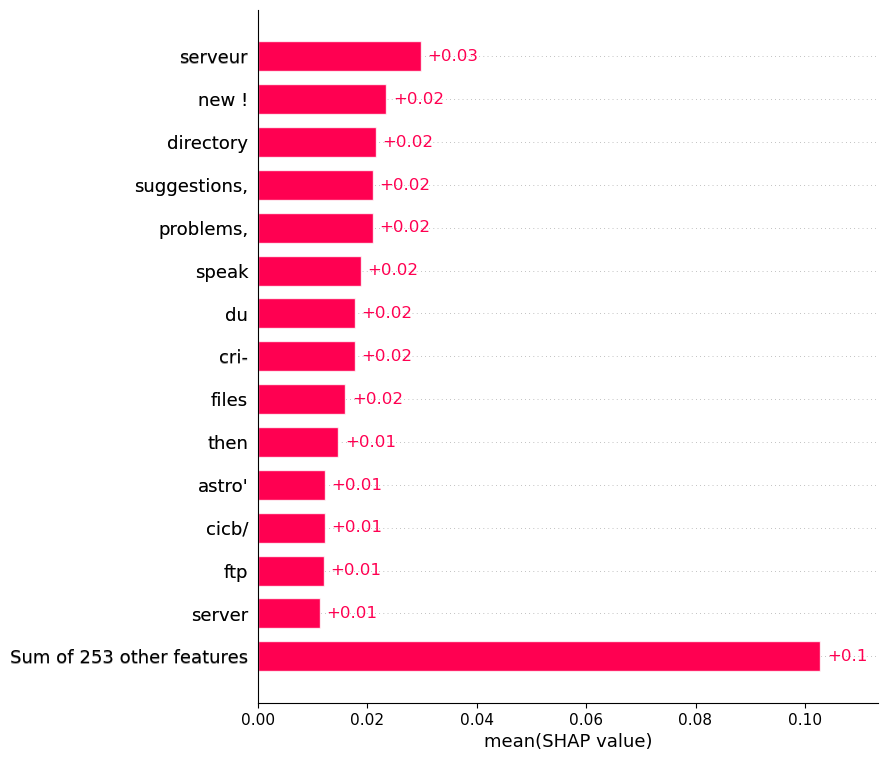

In [33]:
shap.plots.bar(shap_values[:,:, selected_categories[preds[1]]].mean(axis=0), max_display=15,
               order=shap.Explanation.argsort.flip)

In [34]:
print(selected_categories)

['alt.atheism', 'comp.graphics', 'rec.sport.hockey', 'sci.space', 'talk.politics.misc']


In [35]:
import re

tokens = re.split("\W+", X_batch[0].lower())

shap.force_plot(shap_values.base_values[0][preds[0]], shap_values[0][:, preds[0]].values,
                feature_names = tokens[:-1], out_names=selected_categories[preds[0]])

In [36]:
import re

tokens = re.split("\W+", X_batch[1].lower())

shap.force_plot(shap_values.base_values[1][preds[1]], shap_values[1][:, preds[1]].values,
                feature_names = tokens[:-1], out_names=selected_categories[preds[1]])
